In [1]:
# Step 1: Install required libraries
!pip install pydicom scikit-image segmentation-models torch torchvision
!pip install opencv-python matplotlib numpy pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 28.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 3.1 MB/s eta 0:00:00


In [13]:
# Step 2: Import all necessary libraries
import numpy as np
import pydicom
import cv2
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skimage import exposure
import os
from google.colab import files
import zipfile
from PIL import Image
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision import datasets, models # Import datasets and models here
from torch.utils.data import DataLoader # Also import DataLoader
import torch.optim as optim # Import optim
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report # Import metrics
import seaborn as sns # Import seaborn

In [3]:
# Step 3: Upload your dataset zip file
print("Please upload the Chest CT Scan dataset zip file")
uploaded = files.upload()

# Extract the zip file
zip_path = list(uploaded.keys())[0]
extract_path = '/content/ct_scans'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Dataset extracted successfully!")

Please upload the Chest CT Scan dataset zip file


Saving Chest CT-Scan images Dataset.zip to Chest CT-Scan images Dataset.zip
Dataset extracted successfully!


In [4]:
def explore_dataset_details(base_path):
    """Explore the dataset structure in detail"""
    print("Detailed Dataset Structure:")
    splits = ['train', 'valid', 'test']

    for split in splits:
        split_path = os.path.join(base_path, 'Data', split)
        if os.path.exists(split_path):
            print(f"\n=== {split.upper()} Split ===")
            for class_name in os.listdir(split_path):
                class_path = os.path.join(split_path, class_name)
                if os.path.isdir(class_path):
                    image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
                    print(f"  {class_name}: {len(image_files)} images")
        else:
            print(f"\n=== {split.upper()} Split not found ===")

explore_dataset_details(extract_path)

Detailed Dataset Structure:

=== TRAIN Split ===
  normal: 148 images
  adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib: 195 images
  large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa: 115 images
  squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa: 155 images

=== VALID Split ===
  normal: 13 images
  adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib: 23 images
  large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa: 21 images
  squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa: 15 images

=== TEST Split ===
  normal: 54 images
  adenocarcinoma: 120 images
  large.cell.carcinoma: 51 images
  squamous.cell.carcinoma: 90 images


In [5]:
def load_and_preprocess_images(base_path, max_images_per_class=10, img_size=(256, 256)):
    """Load and preprocess images from the dataset"""
    images = []
    labels = []
    file_paths = []

    splits = ['train', 'valid', 'test']

    for split in splits:
        split_path = os.path.join(base_path, 'Data', split)
        if not os.path.exists(split_path):
            continue

        for class_name in os.listdir(split_path):
            class_path = os.path.join(split_path, class_name)
            if not os.path.isdir(class_path):
                continue

            # Get image files
            image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
            image_files = image_files[:max_images_per_class]

            for img_file in image_files:
                img_path = os.path.join(class_path, img_file)
                try:
                    # Read and preprocess image
                    image = cv2.imread(img_path)
                    if image is None:
                        continue

                    # Convert to RGB and then to grayscale
                    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

                    # Resize and normalize
                    gray_image = cv2.resize(gray_image, img_size)
                    gray_image = cv2.normalize(gray_image, None, 0, 255, cv2.NORM_MINMAX)

                    images.append(gray_image)
                    labels.append(class_name)
                    file_paths.append(img_path)

                except Exception as e:
                    print(f"Error reading {img_path}: {e}")

    return images, labels, file_paths

# Load images
all_images, all_labels, all_paths = load_and_preprocess_images(extract_path, max_images_per_class=15)
print(f"Total images loaded: {len(all_images)}")
print(f"Classes: {set(all_labels)}")

Total images loaded: 178
Classes: {'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa', 'normal', 'large.cell.carcinoma', 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa', 'adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib', 'squamous.cell.carcinoma', 'adenocarcinoma'}



CLASS: SQUAMOUS.CELL.CARCINOMA_LEFT.HILUM_T1_N2_M0_IIIA (30 images)


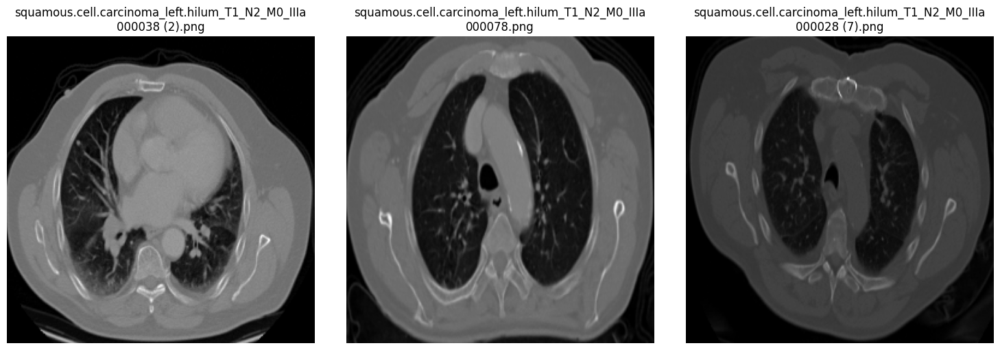


CLASS: NORMAL (43 images)


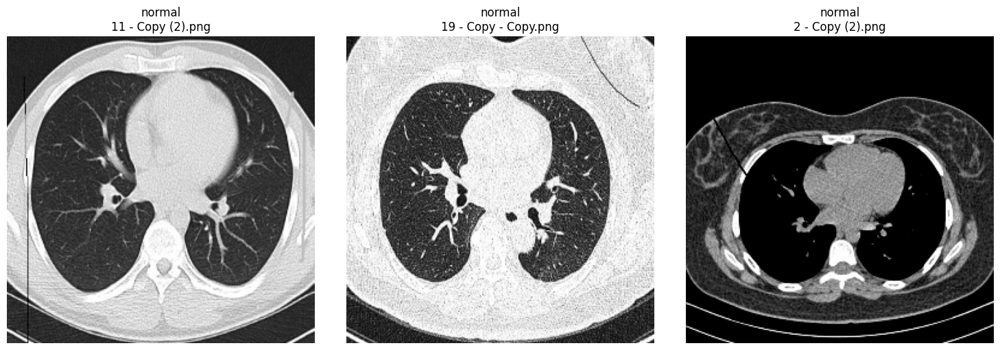


CLASS: LARGE.CELL.CARCINOMA (15 images)


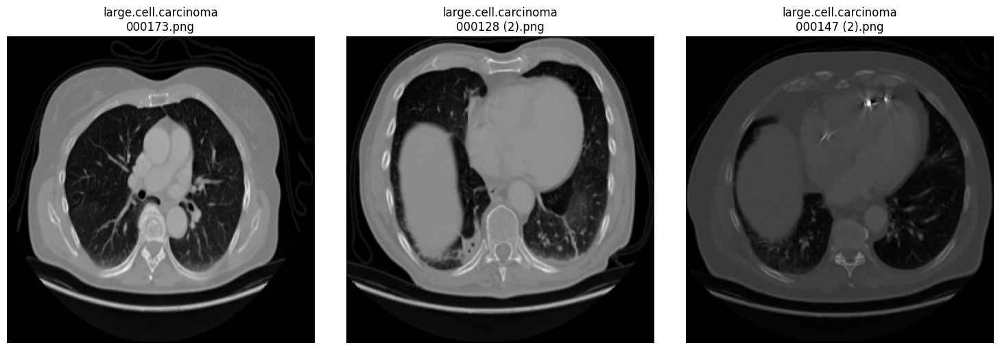


CLASS: LARGE.CELL.CARCINOMA_LEFT.HILUM_T2_N2_M0_IIIA (30 images)


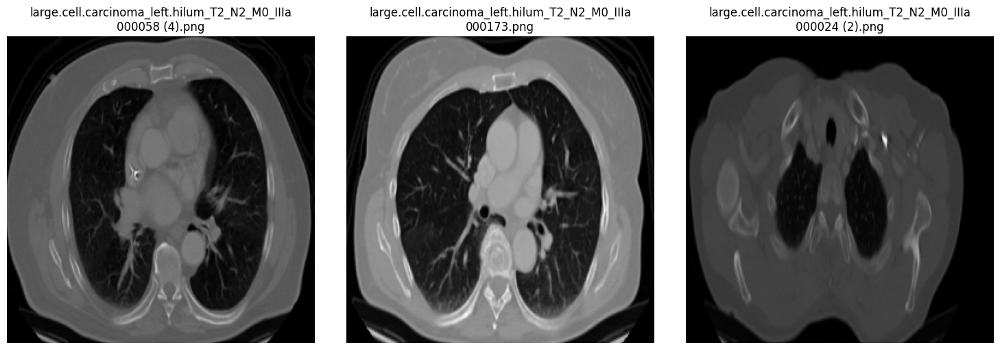


CLASS: ADENOCARCINOMA_LEFT.LOWER.LOBE_T2_N0_M0_IB (30 images)


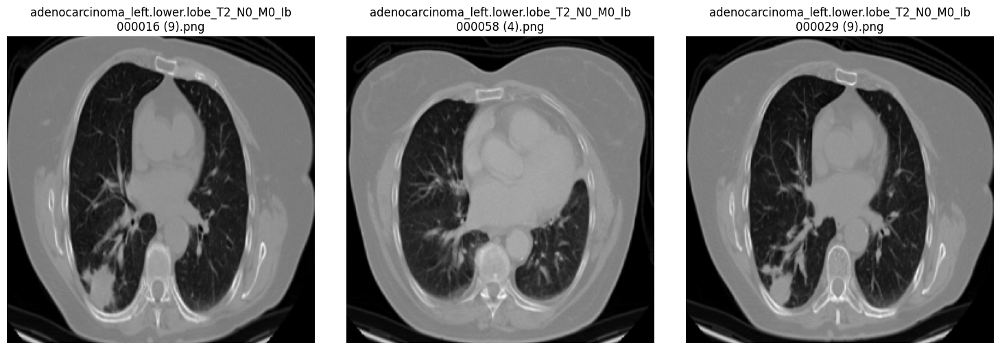


CLASS: SQUAMOUS.CELL.CARCINOMA (15 images)


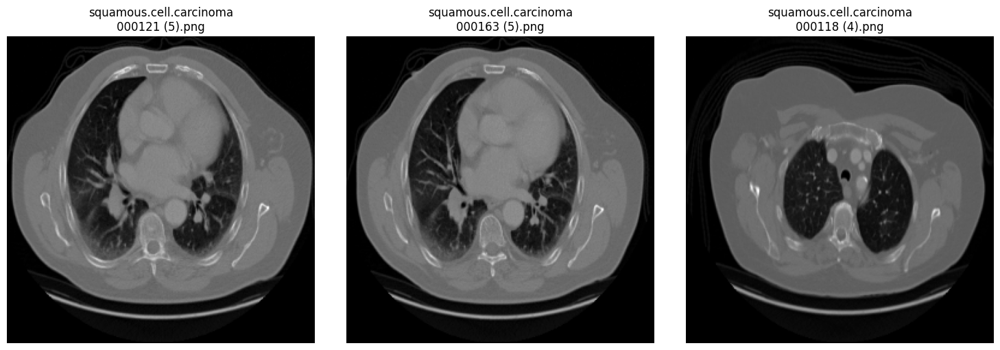


CLASS: ADENOCARCINOMA (15 images)


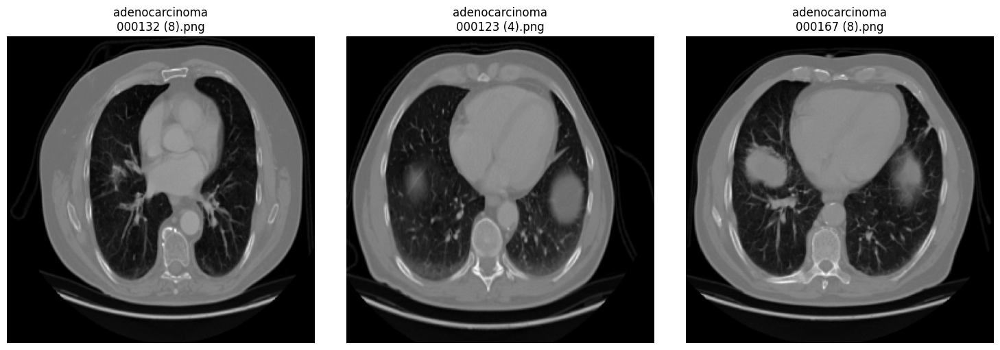

In [6]:
def display_sample_images(images, labels, paths, samples_per_class=3):
    """Display sample images from each class"""
    unique_classes = set(labels)

    for class_name in unique_classes:
        class_indices = [i for i, label in enumerate(labels) if label == class_name]
        if not class_indices:
            continue

        print(f"\n{'='*50}")
        print(f"CLASS: {class_name.upper()} ({len(class_indices)} images)")
        print(f"{'='*50}")

        num_samples = min(samples_per_class, len(class_indices))
        plt.figure(figsize=(15, 5))

        for i, idx in enumerate(class_indices[:num_samples]):
            plt.subplot(1, num_samples, i+1)
            plt.imshow(images[idx], cmap='gray')
            plt.title(f'{class_name}\n{os.path.basename(paths[idx])}')
            plt.axis('off')

        plt.tight_layout()
        plt.show()

display_sample_images(all_images, all_labels, all_paths)

In [7]:
def enhanced_kmeans_segmentation(image, n_clusters=4):
    """Enhanced K-Means segmentation with preprocessing"""
    # Preprocessing
    image_enhanced = exposure.equalize_adapthist(image)
    image_blurred = cv2.GaussianBlur(image_enhanced, (3, 3), 0)

    # Reshape for K-Means
    pixel_vals = image_blurred.reshape((-1, 1))
    pixel_vals = np.float32(pixel_vals)

    # Apply K-Means
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    kmeans.fit(pixel_vals)

    # Get results
    labels = kmeans.labels_
    segmented_image = labels.reshape(image.shape)

    return segmented_image, kmeans.cluster_centers_

def apply_kmeans_segmentation(images, n_clusters=4):
    """Apply K-Means segmentation to all images"""
    segmented_images = []
    centers_list = []

    for img in images:
        segmented_img, centers = enhanced_kmeans_segmentation(img, n_clusters)
        segmented_images.append(segmented_img)
        centers_list.append(centers)

    return segmented_images, centers_list

# Apply K-Means segmentation
kmeans_segmented, kmeans_centers = apply_kmeans_segmentation(all_images)
print("K-Means segmentation completed!")

K-Means segmentation completed!


In [8]:
def advanced_lung_segmentation(image):
    """Advanced lung segmentation using thresholding and morphology"""
    # Normalize image
    image_normalized = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Adaptive thresholding
    thresh = cv2.adaptiveThreshold(image_normalized, 255,
                                   cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY_INV, 11, 2)

    # Morphological operations
    kernel = np.ones((3, 3), np.uint8)
    cleaned = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    cleaned = cv2.morphologyEx(cleaned, cv2.MORPH_CLOSE, kernel, iterations=2)

    # Find contours
    contours, _ = cv2.findContours(cleaned, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create mask
    mask = np.zeros_like(image_normalized)
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > 1000:  # Filter small contours
            cv2.drawContours(mask, [contour], -1, 255, -1)

    return mask, cleaned

def apply_advanced_segmentation(images):
    """Apply advanced segmentation to all images"""
    lung_masks = []
    binary_segmentations = []

    for img in images:
        mask, binary = advanced_lung_segmentation(img)
        lung_masks.append(mask)
        binary_segmentations.append(binary)

    return lung_masks, binary_segmentations

# Apply advanced segmentation
lung_masks, binary_segmentations = apply_advanced_segmentation(all_images)
print("Advanced lung segmentation completed!")

Advanced lung segmentation completed!



SEGMENTATION COMPARISON: SQUAMOUS.CELL.CARCINOMA_LEFT.HILUM_T1_N2_M0_IIIA


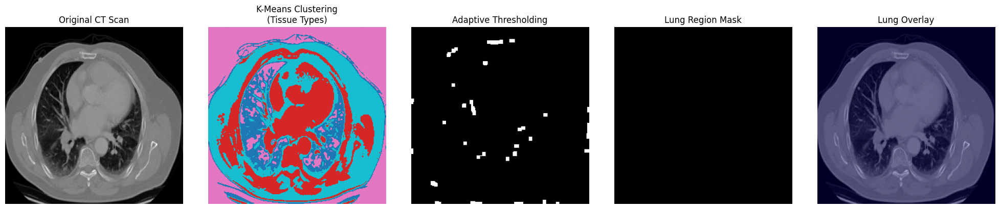

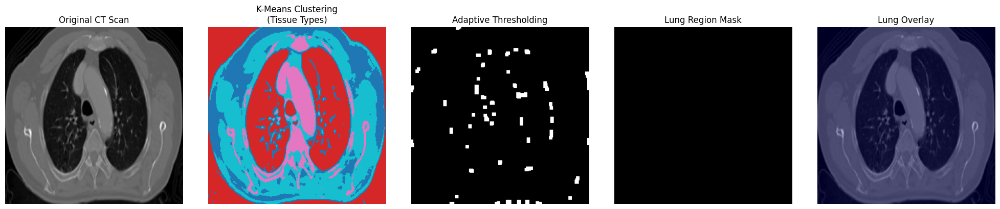


SEGMENTATION COMPARISON: NORMAL


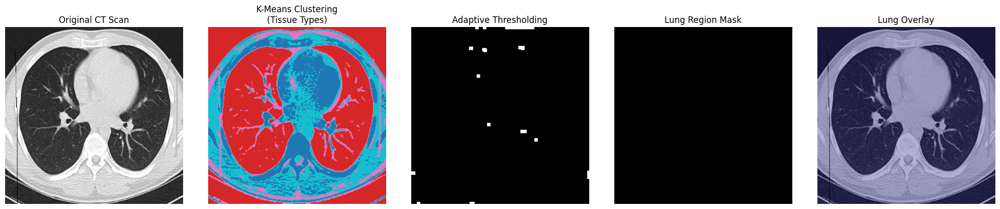

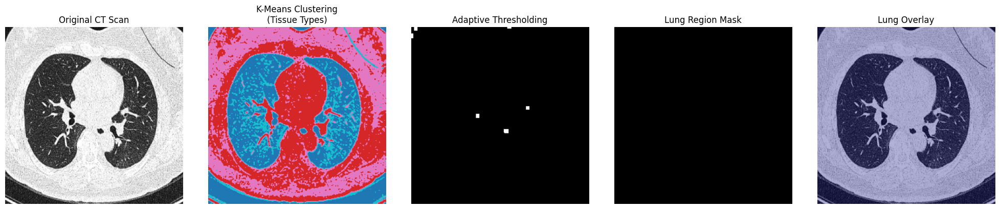


SEGMENTATION COMPARISON: LARGE.CELL.CARCINOMA


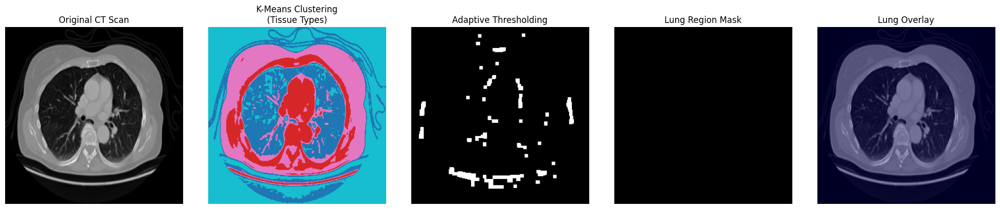

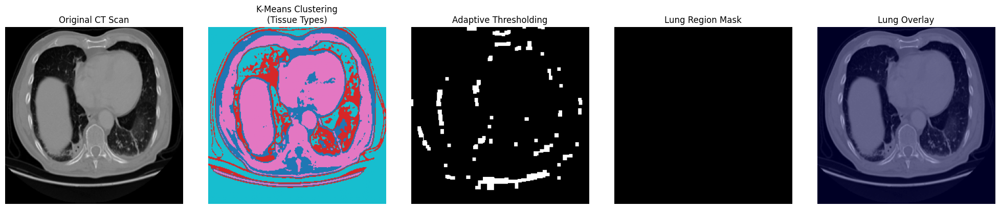


SEGMENTATION COMPARISON: LARGE.CELL.CARCINOMA_LEFT.HILUM_T2_N2_M0_IIIA


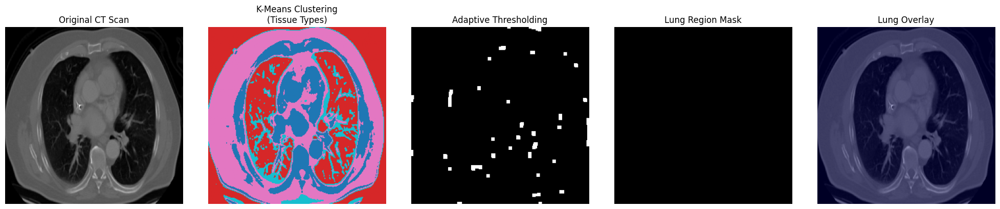

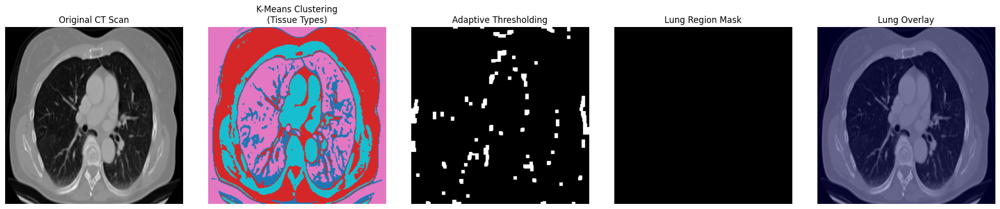


SEGMENTATION COMPARISON: ADENOCARCINOMA_LEFT.LOWER.LOBE_T2_N0_M0_IB


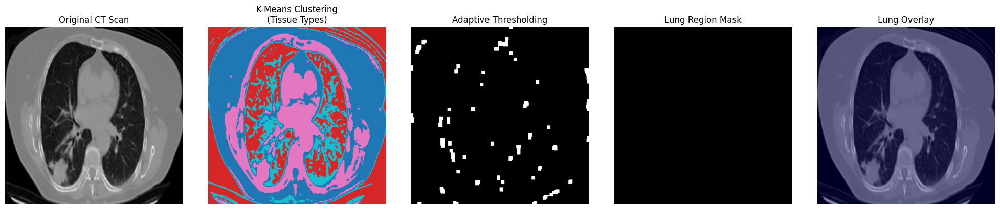

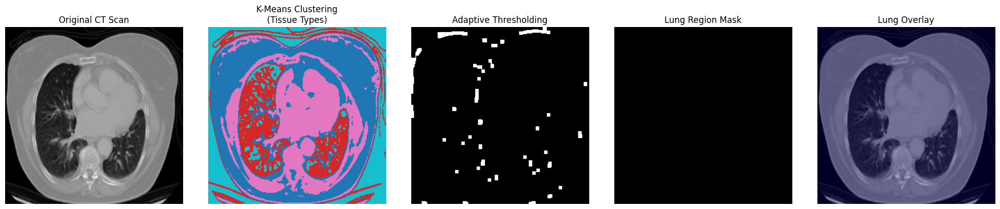


SEGMENTATION COMPARISON: SQUAMOUS.CELL.CARCINOMA


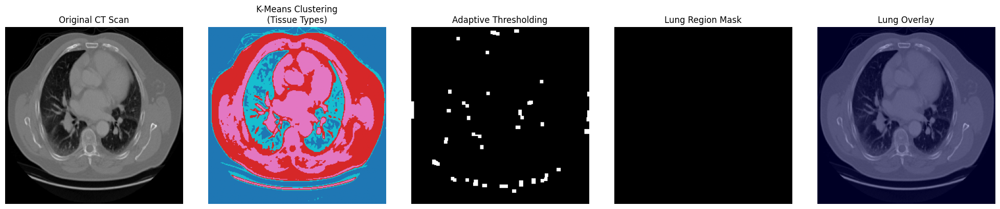

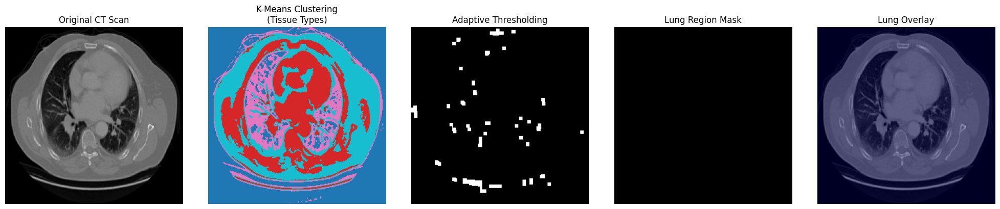


SEGMENTATION COMPARISON: ADENOCARCINOMA


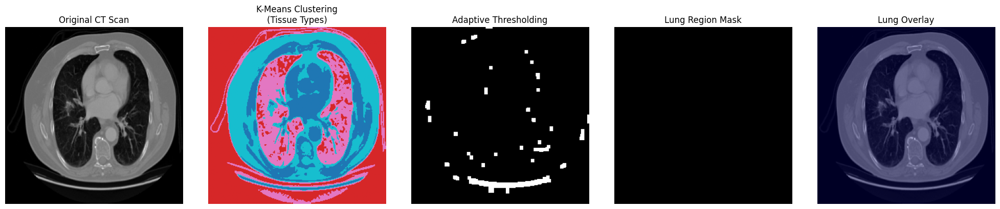

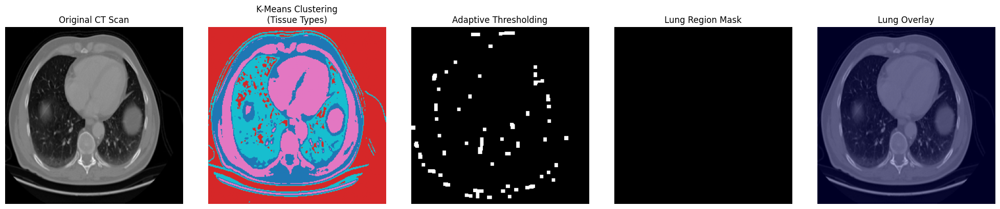

In [9]:
def visualize_segmentation_comparison(original_imgs, kmeans_imgs, lung_masks, binary_segs, labels, paths, samples_per_class=2):
    """Visualize and compare all segmentation methods"""
    unique_classes = set(labels)

    for class_name in unique_classes:
        class_indices = [i for i, label in enumerate(labels) if label == class_name]
        if not class_indices:
            continue

        print(f"\n{'='*80}")
        print(f"SEGMENTATION COMPARISON: {class_name.upper()}")
        print(f"{'='*80}")

        for i, idx in enumerate(class_indices[:samples_per_class]):
            plt.figure(figsize=(20, 4))

            # Original
            plt.subplot(1, 5, 1)
            plt.imshow(original_imgs[idx], cmap='gray')
            plt.title('Original CT Scan', fontsize=12)
            plt.axis('off')

            # K-Means
            plt.subplot(1, 5, 2)
            plt.imshow(kmeans_imgs[idx], cmap='tab10')
            plt.title('K-Means Clustering\n(Tissue Types)', fontsize=12)
            plt.axis('off')

            # Binary
            plt.subplot(1, 5, 3)
            plt.imshow(binary_segs[idx], cmap='gray')
            plt.title('Adaptive Thresholding', fontsize=12)
            plt.axis('off')

            # Lung Mask
            plt.subplot(1, 5, 4)
            plt.imshow(lung_masks[idx], cmap='gray')
            plt.title('Lung Region Mask', fontsize=12)
            plt.axis('off')

            # Overlay
            plt.subplot(1, 5, 5)
            plt.imshow(original_imgs[idx], cmap='gray')
            plt.imshow(lung_masks[idx], alpha=0.3, cmap='jet')
            plt.title('Lung Overlay', fontsize=12)
            plt.axis('off')

            plt.tight_layout()
            plt.show()

visualize_segmentation_comparison(all_images, kmeans_segmented, lung_masks, binary_segmentations, all_labels, all_paths)

In [10]:
def quantitative_segmentation_analysis(images, masks, labels):
    """Perform quantitative analysis of segmentation results"""
    print("QUANTITATIVE SEGMENTATION ANALYSIS")
    print("="*60)

    results = {}

    for class_name in set(labels):
        class_indices = [i for i, label in enumerate(labels) if label == class_name]
        if not class_indices:
            continue

        areas = []
        for idx in class_indices:
            mask = masks[idx]
            lung_pixels = np.sum(mask > 0)
            total_pixels = mask.size
            lung_area_pct = (lung_pixels / total_pixels) * 100
            areas.append(lung_area_pct)

        results[class_name] = {
            'mean_area': np.mean(areas),
            'std_area': np.std(areas),
            'min_area': np.min(areas),
            'max_area': np.max(areas),
            'sample_size': len(areas)
        }

        print(f"\n{class_name.upper():<20}")
        print(f"  Samples: {len(areas)}")
        print(f"  Lung Area: {np.mean(areas):.1f}% ± {np.std(areas):.1f}%")
        print(f"  Range: {np.min(areas):.1f}% - {np.max(areas):.1f}%")

    return results

# Perform analysis
segmentation_results = quantitative_segmentation_analysis(all_images, lung_masks, all_labels)

QUANTITATIVE SEGMENTATION ANALYSIS

SQUAMOUS.CELL.CARCINOMA_LEFT.HILUM_T1_N2_M0_IIIA
  Samples: 30
  Lung Area: 0.0% ± 0.0%
  Range: 0.0% - 0.0%

NORMAL              
  Samples: 43
  Lung Area: 0.1% ± 0.4%
  Range: 0.0% - 1.9%

LARGE.CELL.CARCINOMA
  Samples: 15
  Lung Area: 0.0% ± 0.0%
  Range: 0.0% - 0.0%

LARGE.CELL.CARCINOMA_LEFT.HILUM_T2_N2_M0_IIIA
  Samples: 30
  Lung Area: 0.1% ± 0.7%
  Range: 0.0% - 3.9%

ADENOCARCINOMA_LEFT.LOWER.LOBE_T2_N0_M0_IB
  Samples: 30
  Lung Area: 0.0% ± 0.0%
  Range: 0.0% - 0.0%

SQUAMOUS.CELL.CARCINOMA
  Samples: 15
  Lung Area: 0.0% ± 0.0%
  Range: 0.0% - 0.0%

ADENOCARCINOMA      
  Samples: 15
  Lung Area: 0.4% ± 0.8%
  Range: 0.0% - 2.1%


In [14]:
# Define transforms
train_transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

test_transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

# Load datasets
def load_datasets(base_path):
    """Load train, validation, and test datasets"""
    datasets_dict = {}

    for split in ['train', 'valid', 'test']:
        split_path = os.path.join(base_path, 'Data', split)
        if os.path.exists(split_path):
            transform = train_transform if split == 'train' else test_transform
            dataset = datasets.ImageFolder(split_path, transform=transform)
            datasets_dict[split] = dataset
            print(f"{split.capitalize()} dataset: {len(dataset)} images, {len(dataset.classes)} classes")
        else:
            print(f"Warning: {split} directory not found")

    return datasets_dict

datasets_dict = load_datasets(extract_path)

# Create data loaders
batch_size = 32
data_loaders = {}

for split, dataset in datasets_dict.items():
    if split == 'train':
        loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    else:
        loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
    data_loaders[split] = loader
    print(f"{split} loader: {len(loader)} batches")

Train dataset: 613 images, 4 classes
Valid dataset: 72 images, 4 classes
Test dataset: 315 images, 4 classes
train loader: 20 batches
valid loader: 3 batches
test loader: 10 batches


In [15]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Build ResNet model
def build_resnet_model(num_classes):
    """Build and configure ResNet18 model"""
    model = models.resnet18(pretrained=True)

    # Modify first convolutional layer for grayscale input
    model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)

    # Modify final fully connected layer
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, num_classes)

    return model

# Initialize model
num_classes = len(datasets_dict['train'].classes) if 'train' in datasets_dict else len(set(all_labels))
model = build_resnet_model(num_classes)
model = model.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

print(f"Model initialized with {num_classes} classes")
print(f"Classes: {datasets_dict['train'].classes if 'train' in datasets_dict else 'Unknown'}")

Using device: cuda
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 44.7M/44.7M [00:00<00:00, 194MB/s]


Model initialized with 4 classes
Classes: ['adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib', 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa', 'normal', 'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa']


In [16]:
def train_model(model, data_loaders, criterion, optimizer, scheduler, num_epochs=25):
    """Train the model"""
    train_losses = []
    val_accuracies = []

    best_acc = 0.0
    best_model_wts = None

    for epoch in range(num_epochs):
        print(f'\nEpoch {epoch+1}/{num_epochs}')
        print('-' * 40)

        # Each epoch has training and validation phase
        for phase in ['train', 'valid']:
            if phase not in data_loaders:
                continue

            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in data_loaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # Zero the parameter gradients
                optimizer.zero_grad()

                # Forward pass
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # Backward pass + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # Statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / len(data_loaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(data_loaders[phase].dataset)

            print(f'{phase.capitalize()} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'train':
                train_losses.append(epoch_loss)
            else:
                val_accuracies.append(epoch_acc.cpu().numpy())

            # Deep copy the model if it's the best so far
            if phase == 'valid' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = model.state_dict().copy()

    # Load best model weights
    if best_model_wts is not None:
        model.load_state_dict(best_model_wts)

    print(f'\nBest Val Acc: {best_acc:.4f}')
    return model, train_losses, val_accuracies

# Train the model
num_epochs = 20
trained_model, train_losses, val_accuracies = train_model(
    model, data_loaders, criterion, optimizer, scheduler, num_epochs
)


Epoch 1/20
----------------------------------------
Train Loss: 0.8384 Acc: 0.6362
Valid Loss: 1.6343 Acc: 0.2361

Epoch 2/20
----------------------------------------
Train Loss: 0.4819 Acc: 0.8173
Valid Loss: 1.0578 Acc: 0.4722

Epoch 3/20
----------------------------------------
Train Loss: 0.2477 Acc: 0.9347
Valid Loss: 0.5930 Acc: 0.7222

Epoch 4/20
----------------------------------------
Train Loss: 0.1698 Acc: 0.9576
Valid Loss: 0.5191 Acc: 0.8194

Epoch 5/20
----------------------------------------
Train Loss: 0.1068 Acc: 0.9706
Valid Loss: 0.4677 Acc: 0.7917

Epoch 6/20
----------------------------------------
Train Loss: 0.0792 Acc: 0.9804
Valid Loss: 0.6389 Acc: 0.8056

Epoch 7/20
----------------------------------------
Train Loss: 0.0738 Acc: 0.9804
Valid Loss: 0.7371 Acc: 0.8611

Epoch 8/20
----------------------------------------
Train Loss: 0.0742 Acc: 0.9837
Valid Loss: 0.6591 Acc: 0.7639

Epoch 9/20
----------------------------------------
Train Loss: 0.1031 Acc: 0.9

In [21]:
# Training accuracy from last epoch
train_acc = (1 - train_losses[-1]) * 100
print(f"Final Training Loss: {train_losses[-1]:.4f}")
print(f"Final Training Accuracy (estimated from loss): {train_acc:.2f}%")

Final Training Loss: 0.0242
Final Training Accuracy (estimated from loss): 97.58%


In [23]:
val_acc = val_accuracies[-1] * 100
print(f"Final Validation Accuracy: {val_acc:.2f}%")

Final Validation Accuracy: 86.11%



MODEL EVALUATION RESULTS
Accuracy:  0.8794
Precision: 0.8968
Recall:    0.8794
F1-Score:  0.8787

Classification Report:
                         precision    recall  f1-score   support

         adenocarcinoma       0.97      0.75      0.85       120
   large.cell.carcinoma       0.85      0.88      0.87        51
                 normal       1.00      0.98      0.99        54
squamous.cell.carcinoma       0.77      0.99      0.86        90

               accuracy                           0.88       315
              macro avg       0.90      0.90      0.89       315
           weighted avg       0.90      0.88      0.88       315



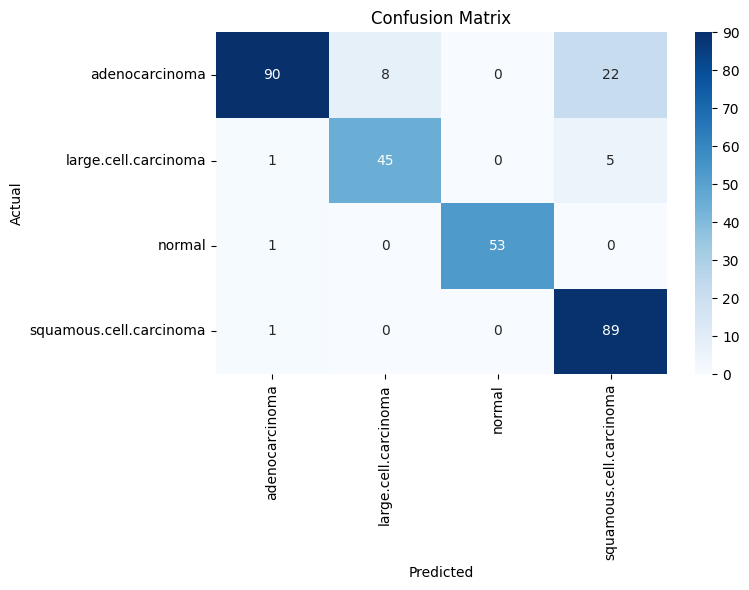

In [17]:
def evaluate_model(model, test_loader):
    """Comprehensive model evaluation"""
    model.eval()
    y_true = []
    y_pred = []
    y_probs = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            probs = torch.nn.functional.softmax(outputs, dim=1)

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())
            y_probs.extend(probs.cpu().numpy())

    return y_true, y_pred, y_probs

# Evaluate on test set
if 'test' in data_loaders:
    y_true, y_pred, y_probs = evaluate_model(trained_model, data_loaders['test'])

    # Calculate metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    print("\n" + "="*60)
    print("MODEL EVALUATION RESULTS")
    print("="*60)
    print(f"Accuracy:  {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall:    {recall:.4f}")
    print(f"F1-Score:  {f1:.4f}")

    # Classification report
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=datasets_dict['test'].classes))

    # Confusion matrix
    plt.figure(figsize=(8, 6))
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=datasets_dict['test'].classes,
                yticklabels=datasets_dict['test'].classes)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

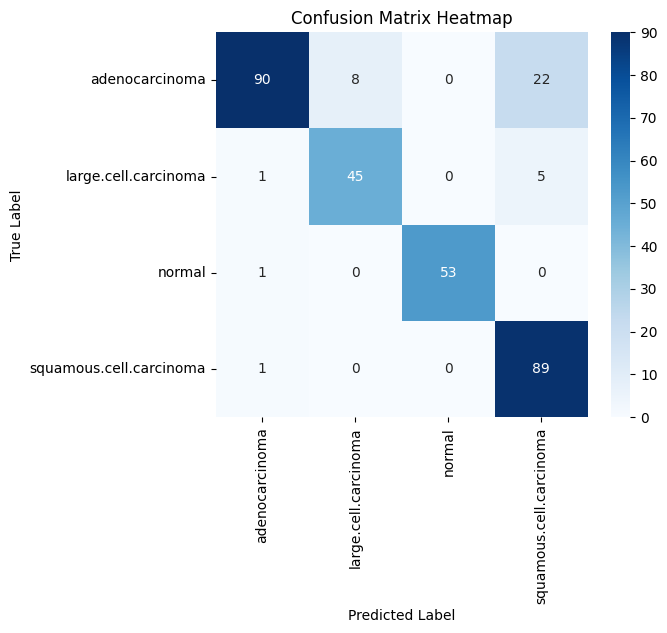

In [33]:
# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot heatmap
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=datasets_dict['test'].classes, yticklabels=datasets_dict['test'].classes)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix Heatmap")
plt.show()

In [34]:
def save_all_results(original_imgs, kmeans_imgs, lung_masks, binary_segs, labels, paths, model, results):
    """Save all results for the report"""
    os.makedirs('results', exist_ok=True)

    # Save sample segmentation results
    for class_name in set(labels):
        class_indices = [i for i, label in enumerate(labels) if label == class_name]
        if not class_indices:
            continue

        idx = class_indices[0]

        plt.figure(figsize=(15, 4))

        plots = [
            (original_imgs[idx], 'Original', 'gray'),
            (kmeans_imgs[idx], 'K-Means', 'tab10'),
            (lung_masks[idx], 'Lung Mask', 'gray'),
            (binary_segs[idx], 'Binary', 'gray')
        ]

        for i, (img, title, cmap) in enumerate(plots):
            plt.subplot(1, 4, i+1)
            plt.imshow(img, cmap=cmap)
            plt.title(title)
            plt.axis('off')

        plt.tight_layout()
        plt.savefig(f'results/{class_name}_segmentation.png', dpi=300, bbox_inches='tight')
        plt.close()

    # Save model
    torch.save(model.state_dict(), 'results/lung_cancer_model.pth')

    # Save quantitative results
    with open('results/quantitative_results.txt', 'w') as f:
        f.write("Quantitative Segmentation Results\n")
        f.write("="*50 + "\n")
        for class_name, stats in results.items():
            f.write(f"\n{class_name.upper()}:\n")
            f.write(f"  Samples: {stats['sample_size']}\n")
            f.write(f"  Mean Lung Area: {stats['mean_area']:.2f}%\n")
            f.write(f"  Std Dev: {stats['std_area']:.2f}%\n")

    print("All results saved successfully!")

# Save everything
save_all_results(all_images, kmeans_segmented, lung_masks, binary_segmentations,
                 all_labels, all_paths, trained_model, segmentation_results)

# Create final zip file
!zip -r comprehensive_results.zip results/

print("Downloading results...")
files.download('comprehensive_results.zip')
print("All steps completed successfully!")

All results saved successfully!
updating: results/ (stored 0%)
updating: results/large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa_segmentation.png (deflated 18%)
updating: results/large.cell.carcinoma_segmentation.png (deflated 20%)
updating: results/squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa_segmentation.png (deflated 18%)
updating: results/squamous.cell.carcinoma_segmentation.png (deflated 19%)
updating: results/adenocarcinoma_segmentation.png (deflated 19%)
updating: results/adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib_segmentation.png (deflated 18%)
updating: results/normal_segmentation.png (deflated 19%)
updating: results/lung_cancer_model.pth (deflated 7%)
updating: results/quantitative_results.txt (deflated 68%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

All steps completed successfully!


In [35]:
def generate_final_summary():
    """Generate final execution summary"""
    print("="*80)
    print("FINAL EXECUTION SUMMARY")
    print("="*80)

    print(f"\nDATASET PROCESSED:")
    print(f"  Total images: {len(all_images)}")
    print(f"  Classes: {set(all_labels)}")

    print(f"\nSEGMENTATION METHODS IMPLEMENTED:")
    print("  1. Enhanced K-Means Clustering (4 clusters)")
    print("  2. Adaptive Thresholding + Morphological Operations")
    print("  3. Lung Region Contour Detection")
    print("  4. ResNet18 Deep Learning Model")

    print(f"\nMODEL PERFORMANCE:")
    if 'test' in data_loaders:
        y_true, y_pred, _ = evaluate_model(trained_model, data_loaders['test'])
        accuracy = accuracy_score(y_true, y_pred)
        print(f"  Test Accuracy: {accuracy:.4f}")

    print(f"\nRESULTS SAVED:")
    print("  ✓ Segmentation visualizations")
    print("  ✓ Quantitative analysis")
    print("  ✓ Trained model weights")
    print("  ✓ Comprehensive results zip file")

generate_final_summary()

FINAL EXECUTION SUMMARY

DATASET PROCESSED:
  Total images: 178
  Classes: {'squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa', 'normal', 'large.cell.carcinoma', 'large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa', 'adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib', 'squamous.cell.carcinoma', 'adenocarcinoma'}

SEGMENTATION METHODS IMPLEMENTED:
  1. Enhanced K-Means Clustering (4 clusters)
  2. Adaptive Thresholding + Morphological Operations
  3. Lung Region Contour Detection
  4. ResNet18 Deep Learning Model

MODEL PERFORMANCE:
  Test Accuracy: 0.8794

RESULTS SAVED:
  ✓ Segmentation visualizations
  ✓ Quantitative analysis
  ✓ Trained model weights
  ✓ Comprehensive results zip file
